In [3]:
import os
import time
from tqdm.notebook import tqdm, trange
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from PIL import Image
import glob

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision
print(torchvision.__version__) # 0.14.1
import torchvision.transforms as transforms
from torchvision.models import resnet34, ResNet34_Weights, resnet18, ResNet18_Weights,\
                                mobilenet_v3_small, MobileNet_V3_Small_Weights


0.15.2+cu118


In [4]:
!pip install ruamel.yaml

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
%cd "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/"
%load_ext autoreload
%autoreload 2
from utils import load_yaml, dump_yaml, \
                  untransform, imshow, plot_tensor_image_grid

/content/drive/MyDrive/Colab Notebooks/CMU/Capstone


In [6]:
!python --version

Python 3.10.11


## Specify Path

In [ ]:
# %cd "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/"

/content/drive/MyDrive/Colab Notebooks/CMU/Capstone


In [7]:
### data folders used for creating training dataset split
## data_split_v1
# data_folder_list = [
#     "./data/IMG_2148",
#     "./data/IMG_2149",
#     "./data/IMG_2150",
#     "./data/IMG_2151",
# ]


# ## data_split_v2
# data_folder_list = [
#     "./data/IMG_2148",
#     "./data/IMG_2149",
#     "./data/IMG_2150",
#     ## "./data/IMG_2151",
#     "./data/22_0_ipad_homog",
#     "./data/22_0_phone_pruned",
#     "./data/22_1_ipad_homog",
#     "./data/22_1_phone_pruned",
# ]
# data_folder_list.extend(sorted(glob.glob("data/synthetic_dataset/*")[:9]))

# data_split_OSMOv1
data_folder_list = [
    "./data/22_0_ipad_homog",
    "./data/22_1_ipad_homog",
]
data_folder_list.extend(sorted(glob.glob("data/synthetic_dataset/*ipad*")))

# ## both_syn_2vid_v1
# data_folder_list = [
#     "./data/22_0_ipad_homog",
#     "./data/22_0_phone_pruned",
#     "./data/22_1_ipad_homog",
#     "./data/22_1_phone_pruned",
# ]
# data_folder_list.extend(sorted(glob.glob("data/synthetic_dataset/*")))

N_LABEL = 11
# load_syn_data = False

data_folder_list

['./data/22_0_ipad_homog',
 './data/22_1_ipad_homog',
 'data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180',
 'data/synthetic_dataset/22_0_ipad_homog_43_c1l3',
 'data/synthetic_dataset/22_0_ipad_homog_Figured_yew_wood_pxr128',
 'data/synthetic_dataset/22_0_ipad_homog_Paintings_11_0003',
 'data/synthetic_dataset/22_0_ipad_homog_Red_shingle_pxr128',
 'data/synthetic_dataset/22_1_ipad_homog_160_c1l5r60',
 'data/synthetic_dataset/22_1_ipad_homog_American_cherry_pxr128',
 'data/synthetic_dataset/22_1_ipad_homog_Brick_0001',
 'data/synthetic_dataset/22_1_ipad_homog_Stucco_pxr128',
 'data/synthetic_dataset/22_1_ipad_homog_Weathered_vertical_pxr128']

## check data & data frequency

In [ ]:
# 1 data folder location
data_folder = data_folder_list[-1]
labels = np.loadtxt(os.path.join(data_folder, "label.txt")).astype(int)
print(len(labels))

1879


(512, 512, 3) 219 20


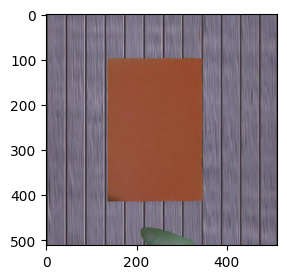

In [ ]:
i = plt.imread(data_folder+"/1.jpg")
H,W,C = i.shape
print(i.shape, i.max(), i.min())
plt.figure(figsize=(3,3))
plt.imshow(i)

In [ ]:
# check class freq
vals, counts = np.unique(labels, return_counts=True)
print(dict(zip(vals,counts)))
plt.bar(vals, counts)
plt.xticks(vals, vals)
plt.title("step/class frequency")
plt.show()
plt.bar(vals[1:], counts[1:])
plt.xticks(vals[1:], vals[1:])
plt.title("step/class frequency excluding 'other' class")
plt.show()

2933 labels for ./data/IMG_2148
{0: 1386, 1: 13, 2: 187, 3: 344, 4: 72, 5: 195, 6: 239, 7: 53, 8: 191, 9: 205, 10: 48}
3159 labels for ./data/IMG_2149
{0: 1410, 1: 27, 2: 166, 3: 196, 4: 148, 5: 209, 6: 358, 7: 123, 8: 188, 9: 161, 10: 173}
3269 labels for ./data/IMG_2150
{0: 1550, 1: 31, 2: 138, 3: 175, 4: 200, 5: 231, 6: 215, 7: 181, 8: 248, 9: 167, 10: 133}
3519 labels for ./data/IMG_2151
{0: 1743, 1: 20, 2: 191, 3: 235, 4: 209, 5: 205, 6: 187, 7: 149, 8: 211, 9: 233, 10: 136}
3242 labels for ./data/22_0_ipad_homog
{0: 2528, 1: 115, 2: 79, 3: 103, 4: 142, 5: 79, 6: 46, 7: 35, 8: 41, 9: 32, 10: 42}
3242 labels for ./data/22_0_phone_pruned
{0: 2545, 1: 112, 2: 78, 3: 101, 4: 139, 5: 77, 6: 44, 7: 36, 8: 40, 9: 30, 10: 40}
1879 labels for ./data/22_1_ipad_homog
{0: 1463, 1: 33, 2: 44, 3: 36, 4: 26, 5: 31, 6: 24, 7: 34, 8: 78, 9: 45, 10: 65}
1879 labels for ./data/22_1_phone_pruned
{0: 1478, 1: 34, 2: 43, 3: 34, 4: 23, 5: 29, 6: 22, 7: 34, 8: 77, 9: 43, 10: 62}
total frames:  23122


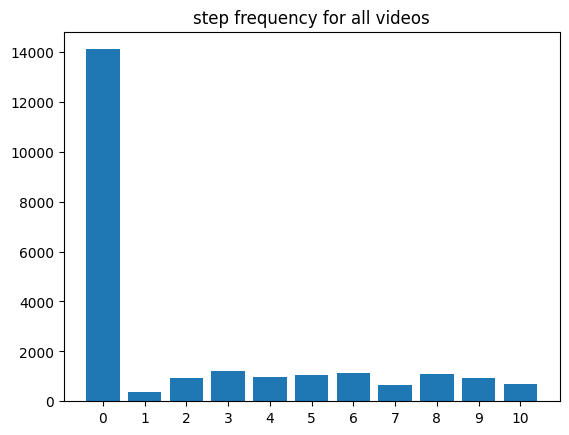

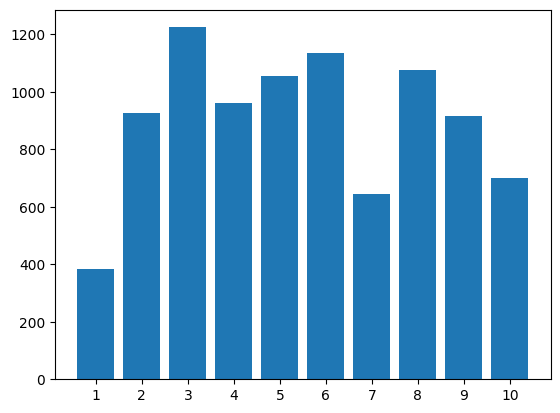

In [ ]:
# all data folder 
counts = np.zeros(N_LABEL)
total_frame = 0
for data_folder in data_folder_list:
# data_folder = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/data/IMG_2149"
  labels = np.loadtxt(os.path.join(data_folder, "label.txt")).astype(int)
  print(len(labels),"labels for", data_folder)
  total_frame += len(labels)

  # check class freq
  vals, curr_counts = np.unique(labels, return_counts=True)
  print(dict(zip(vals,curr_counts)))
  counts += curr_counts
print("total frames: ", total_frame)

plt.bar(vals, counts)
plt.xticks(vals, vals)
plt.title("step frequency for all videos")
plt.show()
plt.bar(vals[1:], counts[1:])
plt.xticks(vals[1:], vals[1:])
# plt.title("step frequency excluding 'other' class for all videos")
plt.savefig("step frequency", dpi=300)
plt.show()

dove: (label 1~11 starts/ends when there is no hand occlusion)

    0: other (including barely touching, excluding hands under the paper)
    1: white paper
    2: blue triangle
    3: 2 w/ a smaller triangle folded over
    4: 3 w/ a white triangle folded back to the left
    5: 4 w/ the bottom half folded up
    6: 5 w/ one wing folded up (pointing leftwards)
    7: flip over
    8: 7 w/ the other wing folded up
    9: 8 horizontally flipped over + mouth folded down
    10: 9 + head insided inverse fold, finish
    -1: end (last frame + 1)
    
For future, maybe 6-8 is one step, 9-10 is one step?

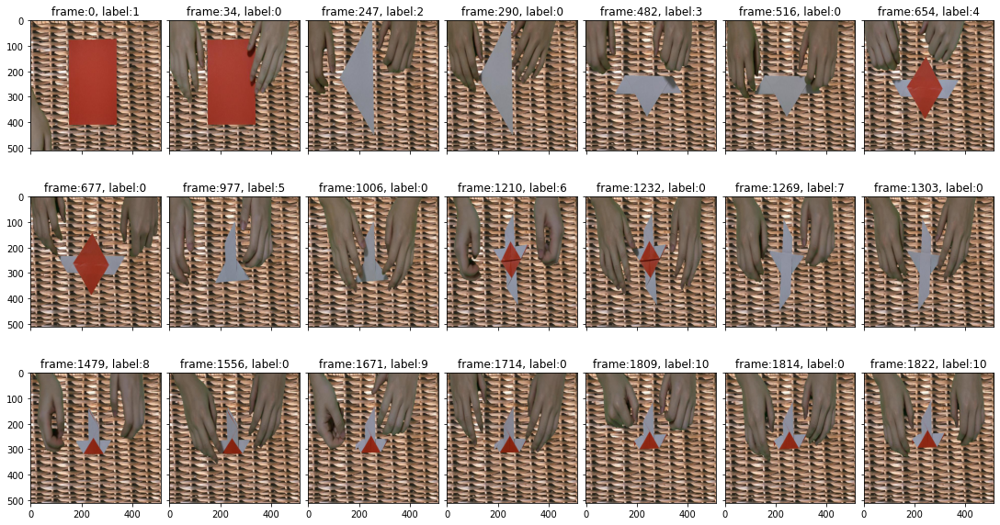

In [ ]:
## preview key frames
# from matplotlib.colorbar import constrained_layout
# data_folder = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/data/IMG_2150"
data_folder = data_folder_list[-1]
img_path_template = os.path.join(data_folder, "{:d}.jpg")
label = np.loadtxt(os.path.join(data_folder, "label.txt"), dtype=np.int8)
label_interval = {i:label[i] for i in range(1, len(label)) if label[i] != label[i-1] }
label_interval[0]=1
key_frame_pair = sorted(label_interval.items())

# plot in grids
ncol = 7
nrow = (len(key_frame_pair)-1) //ncol +1
fig, axes = plt.subplots(nrow, ncol, sharex=True, sharey=True, constrained_layout=True, figsize=(15,8))
for i in range(len(key_frame_pair)):
  frame_num, label = key_frame_pair[i]
  img = plt.imread(img_path_template.format(frame_num))
  axes[i//ncol, i%ncol].imshow(img)
  # axes[i//ncol, i%ncol].axis("off")
  axes[i//ncol, i%ncol].set_title(f"frame:{frame_num}, label:{label}")
for i in range(len(key_frame_pair), nrow*ncol):
  axes[i//ncol, i%ncol].axis("off")
plt.show()

In [ ]:
## preview key frames with manual label_interval
# from matplotlib.colorbar import constrained_layout
data_folder = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/data/IMG_2150"
img_path_template = os.path.join(data_folder, "{:d}.jpg")
label_interval = {0:1, 31:0, 199:2, 328:0, 337:2, 346:0, 631:3, 806:0, 950:4, 1150:0, 1506:5, 1737:0, 1888:6, 
                  2103:0, 2137:7, 2313:0, 2315:7, 2320:0, 2470:8, 2718:0, 2872:9, 3039:0, 3136:10, 3269:-1}
key_frame_pair = sorted(label_interval.items())[:-1]

# plot in grids
ncol = 7
nrow = (len(key_frame_pair)-1) //ncol +1
fig, axes = plt.subplots(nrow, ncol, sharex=True, sharey=True, constrained_layout=True, figsize=(13,12))
for i in range(len(key_frame_pair)):
  frame_num, label = key_frame_pair[i]
  img = plt.imread(img_path_template.format(frame_num))
  axes[i//ncol, i%ncol].imshow(img)
  # axes[i//ncol, i%ncol].axis("off")
  axes[i//ncol, i%ncol].set_title(f"frame:{frame_num}, label:{label}")
for i in range(len(key_frame_pair), nrow*ncol):
  axes[i//ncol, i%ncol].axis("off")
plt.show()

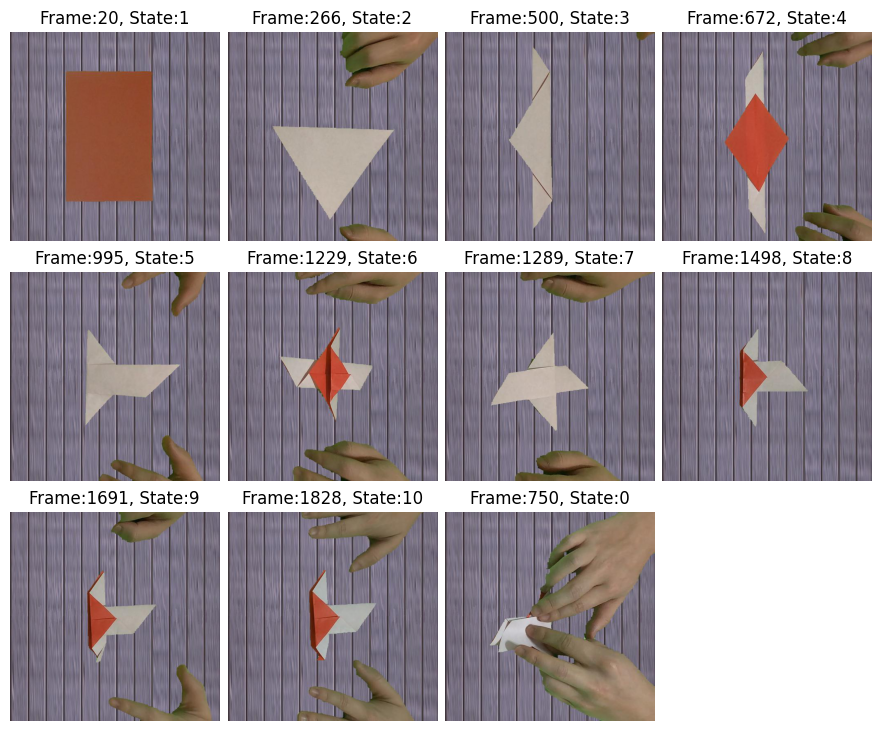

In [39]:
## (Paper) preview each step with state 0 only at the end
# data_folder = data_folder_list[1]
data_folder = data_folder_list[-1]
img_path_template = os.path.join(data_folder, "{:d}.jpg")
label = np.loadtxt(os.path.join(data_folder, "label.txt"), dtype=np.int8)
label_interval = {i:label[i] for i in range(1, len(label)) if label[i] != label[i-1] }
label_interval[0] = label[0]
# key_frame_pair = sorted(label_interval.items(), key=lambda x:x[1])
from collections import defaultdict
label2frames_dict = defaultdict(list)
for frame,label in label_interval.items():
    label2frames_dict[label].append(frame)
# key_frame_pair = [(label2frames_dict[i][0]+20, i) for i in range(1,11)] + [(label2frames_dict[0][6]+5,0)]
# hardcode to match the paper
key_frame_pair = [(20,1)] + [(label2frames_dict[i][0]+20, i) for i in range(2,11)] + [(750,0)]

# plot in grids
ncol = 4
nrow = (len(key_frame_pair)-1) //ncol +1
# fig, axes = plt.subplots(nrow, ncol, sharex=True, sharey=True, constrained_layout=True, figsize=(11.1,10.7))
# fig, axes = plt.subplots(nrow, ncol, sharex=True, sharey=True, constrained_layout=True, figsize=(13,12))
# fig, axes = plt.subplots(nrow, ncol, sharex=True, sharey=True, constrained_layout=True, figsize=(12,9.8))
# fig, axes = plt.subplots(nrow, ncol, sharex=True, sharey=True, constrained_layout=True, figsize=(18,9.8))
fig, axes = plt.subplots(nrow, ncol, sharex=True, sharey=True, constrained_layout=True, figsize=(8.7,7.2))
# fig, axes = plt.subplots(nrow, ncol, sharex=True, sharey=True, constrained_layout=True, figsize=(13,7.2))
for i in range(len(key_frame_pair)):
  frame_num, label = key_frame_pair[i]
  img = plt.imread(img_path_template.format(frame_num))
  axes[i//ncol, i%ncol].imshow(img)
  axes[i//ncol, i%ncol].axis("off")
  axes[i//ncol, i%ncol].set_title(f"Frame:{frame_num}, State:{label}") 
for i in range(len(key_frame_pair), nrow*ncol):
  axes[i//ncol, i%ncol].axis("off")
# plt.savefig("output_img/dataset_steps_tuned2", dpi=500)
# plt.savefig("output_img/syn_dataset_steps_tuned2", dpi=500)
plt.show()

## Build/check dataset split

In [ ]:
# img_path_list = []
# label_list = []
# for data_folder in data_folder_list:
#     labels = np.loadtxt(os.path.join(data_folder, "label.txt")).astype(int)

#     # add label
#     print(len(labels),"labels for", data_folder)
#     label_list.append(labels)

#     # Add image names
#     image_paths = [os.path.join(data_folder, "{:d}.jpg".format(i)) for i in range(len(labels)) ]
#     img_path_list.extend(image_paths)

# label_list = np.concatenate(label_list)
# img_path_list = np.array(img_path_list)
# print("total len:", len(img_path_list), len(label_list))

# vals, curr_counts = np.unique(label_list, return_counts=True)
# print(dict(zip(vals, curr_counts)))

3242 labels for ./data/22_0_ipad_homog
3242 labels for ./data/22_0_phone_pruned
1879 labels for ./data/22_1_ipad_homog
1879 labels for ./data/22_1_phone_pruned
3242 labels for data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180
3242 labels for data/synthetic_dataset/22_0_ipad_homog_43_c1l3
3242 labels for data/synthetic_dataset/22_0_ipad_homog_Figured_yew_wood_pxr128
3242 labels for data/synthetic_dataset/22_0_ipad_homog_Paintings_11_0003
3242 labels for data/synthetic_dataset/22_0_ipad_homog_Red_shingle_pxr128
3242 labels for data/synthetic_dataset/22_0_phone_pruned_146_c1l4r120
3242 labels for data/synthetic_dataset/22_0_phone_pruned_183_c1l1r180
3242 labels for data/synthetic_dataset/22_0_phone_pruned_213_c1l8r180
3242 labels for data/synthetic_dataset/22_0_phone_pruned_Black_granite_pxr128
3242 labels for data/synthetic_dataset/22_0_phone_pruned_Fabric_0001
1879 labels for data/synthetic_dataset/22_1_ipad_homog_160_c1l5r60
1879 labels for data/synthetic_dataset/22_1_ipad_homog_Amer

In [ ]:
# ### split into train/test dataset and save a datasplit file
# TEST_RATIO = 0.1
# VAL_RATIO = 0.1
# MAX_DATA_NUM = min(curr_counts) # deal with class imbalance

# # split each class by the ratio
# train_paths = []
# train_labels = []
# val_paths = []
# val_labels = []
# test_paths = []
# test_labels = []

# test_num = int(MAX_DATA_NUM * TEST_RATIO)
# val_num = int(MAX_DATA_NUM * VAL_RATIO)

# # shuffle
# _, counts = np.unique(label_list, return_counts=True)
# ind = np.random.permutation(len(label_list))
# labels = label_list[ind]
# img_path_list = img_path_list[ind]

# # split
# for i,val in enumerate(range(N_LABEL)):
#   mask = labels == val
#   if counts[i] > MAX_DATA_NUM: # deal with class imbalance 
#     test_labels.extend(labels[mask][:test_num])
#     test_paths.extend(img_path_list[mask][:test_num])
#     val_labels.extend(labels[mask][test_num: test_num+val_num])
#     val_paths.extend(img_path_list[mask][test_num: test_num+val_num])
#     train_labels.extend(labels[mask][test_num+val_num : MAX_DATA_NUM])
#     train_paths.extend(img_path_list[mask][test_num+val_num : MAX_DATA_NUM])
#   else:
#     test_labels.extend(labels[mask][:int(counts[i] * TEST_RATIO)])
#     test_paths.extend(img_path_list[mask][:int(counts[i] * TEST_RATIO)])
#     val_labels.extend(labels[mask][int(counts[i] * TEST_RATIO) : 
#                                    int(counts[i] * (TEST_RATIO + VAL_RATIO))])
#     val_paths.extend(img_path_list[mask][int(counts[i] * TEST_RATIO) : 
#                                          int(counts[i] * (TEST_RATIO + VAL_RATIO))])
#     train_labels.extend(labels[mask][int(counts[i] * (TEST_RATIO + VAL_RATIO)): ])
#     train_paths.extend(img_path_list[mask][int(counts[i] * (TEST_RATIO + VAL_RATIO)): ])

# print("train num:",len(train_paths), len(train_labels), 
#       "val num:",len(val_paths), len(val_labels),
#       "test num:",len(test_paths), len(test_labels))

# # np.savez("data/data_split_v2.npz", 
# # np.savez("data/data_split_OSMOv1.npz", 
# np.savez("data/data_split_both_syn_2vid_v1.npz", 
#          train_paths = train_paths,
#           train_labels = train_labels,
#           val_paths = val_paths,
#           val_labels = val_labels,
#           test_paths = test_paths,
#           test_labels = test_labels,
#           data_folder_list=np.array(data_folder_list))

train num: 7193 7193 val num: 892 892 test num: 891 891


In [ ]:
# videos_set = set()
# for i in train_paths:
#     videos_set.add( os.path.dirname(i) )
# videos_set

In [ ]:
# load train-test-split
def load_data_path_from_split_file(split_file_path="data/data_split_v2.npz"):
    train_test_split = np.load(split_file_path)
    train_paths = train_test_split["train_paths"]
    train_labels = train_test_split["train_labels"]
    val_paths = train_test_split["val_paths"]
    val_labels = train_test_split["val_labels"]
    test_paths = train_test_split["test_paths"]
    test_labels = train_test_split["test_labels"]
    return train_paths, train_labels, val_paths, val_labels, test_paths, test_labels

## load test dataset from a list of folder containing 'frame_label.npz'
def load_test_data_from_folders(test_video_folders):
    test_paths, test_labels = [],[]
    for test_video_folder in test_video_folders:
        label_dict = np.load(os.path.join(test_video_folder, "frame_label.npz"))
        frame_indices, labels =  label_dict['frame_indices'], label_dict["labels"]
        image_paths = [os.path.join(test_video_folder, "{:d}.jpg".format(i)) for i in frame_indices]
        test_paths.append(image_paths)
        test_labels.append(labels)
    test_paths = np.concatenate(test_paths)
    test_labels = np.concatenate(test_labels)
    return test_paths, test_labels

In [ ]:
# ## test load_test_data_from_folders
# test_video_folders = [
#     "data/3_iPad_anno_homog",
#     "data/3_phone_pruned_anno"
# ]
# test_paths, test_labels = load_test_data_from_folders(test_video_folders)
# print(len(test_paths), len(test_labels))
# # print(test_paths, test_labels)


660 660


train_dataset: 7193 val_dataset: 892 test_dataset: 891
train: {0: 654, 1: 654, 2: 654, 3: 654, 4: 654, 5: 654, 6: 653, 7: 654, 8: 654, 9: 654, 10: 654}


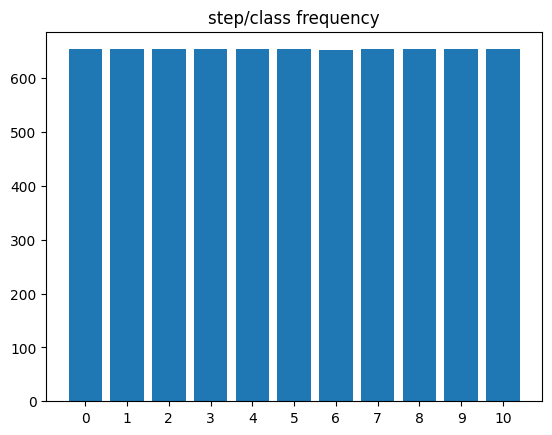

val: {0: 81, 1: 81, 2: 81, 3: 81, 4: 81, 5: 81, 6: 82, 7: 81, 8: 81, 9: 81, 10: 81}


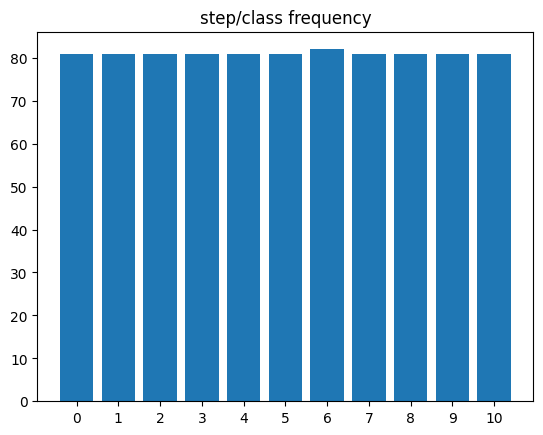

test: {0: 81, 1: 81, 2: 81, 3: 81, 4: 81, 5: 81, 6: 81, 7: 81, 8: 81, 9: 81, 10: 81}


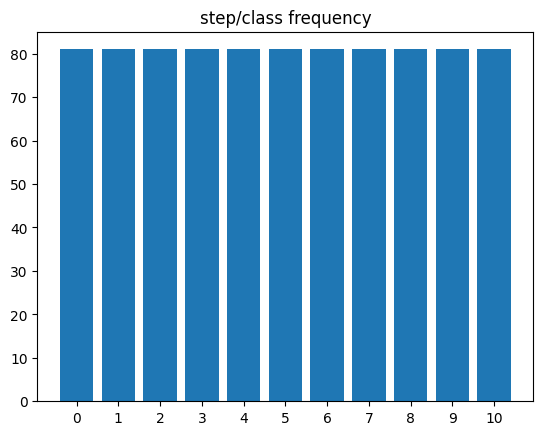

In [ ]:
## test load train-test-split

# split_file_path = "data/data_split_OSMOv1.npz"  # will specify later, so does not matter here
# split_file_path = "data/data_split_v2.npz" 
split_file_path = "data/data_split_both_syn_2vid_v1.npz"

train_paths, train_labels, val_paths, val_labels, test_paths, test_labels = \
    load_data_path_from_split_file(split_file_path=split_file_path)
print("train_dataset:", len(train_paths), 
      "val_dataset:", len(val_paths),
      "test_dataset:", len(test_paths))

# re-check class imbalance issue
train_vals, train_counts = np.unique(train_labels, return_counts=True)
print("train:", dict(zip(train_vals,train_counts)))
plt.bar(train_vals, train_counts)
plt.xticks(train_vals, train_vals)
plt.title("step/class frequency")
plt.show()

val_vals, val_counts = np.unique(val_labels, return_counts=True)
print("val:", dict(zip(val_vals,val_counts)))
plt.bar(val_vals, val_counts)
plt.xticks(val_vals, val_vals)
plt.title("step/class frequency")
plt.show()

test_vals, test_counts = np.unique(test_labels, return_counts=True)
print("test:", dict(zip(test_vals,test_counts)))
plt.bar(test_vals, test_counts)
plt.xticks(test_vals, test_vals)
plt.title("step/class frequency")
plt.show()

In [ ]:
# preprocess = ResNet34_Weights.DEFAULT.transforms()
# preprocess

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

## Build dataset

In [ ]:
# build dataset & transformation
train_tansform = transforms.Compose([
	transforms.ToTensor(),
	# transforms.CenterCrop(H),
	transforms.Resize((256,256), interpolation=transforms.InterpolationMode.BILINEAR, antialias=True),
	transforms.RandomHorizontalFlip(),
	transforms.RandomVerticalFlip(),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.4),
    transforms.RandomApply([
        transforms.ColorJitter(0.3, 0.1, 0.1, 0.5),
        transforms.RandomRotation(10),
        # transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 0.7)),
    ], p=0.7),
       
	transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transform = transforms.Compose([
	transforms.ToTensor(),
	# transforms.CenterCrop(H),
	transforms.Resize((256,256), interpolation=transforms.InterpolationMode.BILINEAR, antialias=True),
	transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class oriDataset(Dataset):
  def __init__(self, paths, labels, eval=False):
    self.labels = labels
    self.paths = paths
    self.evel = eval
    self.transform = test_transform if eval else train_tansform
  
  def __len__(self):
    return len(self.labels)
  
  def __getitem__(self, idx):
    path = self.paths[idx]
    label = self.labels[idx]
    img = np.array(Image.open(path))
    # img = torchvision.io.read_image()
    img = self.transform(img)
    return img, label

(512, 512, 3) 255 0


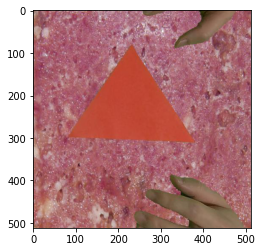

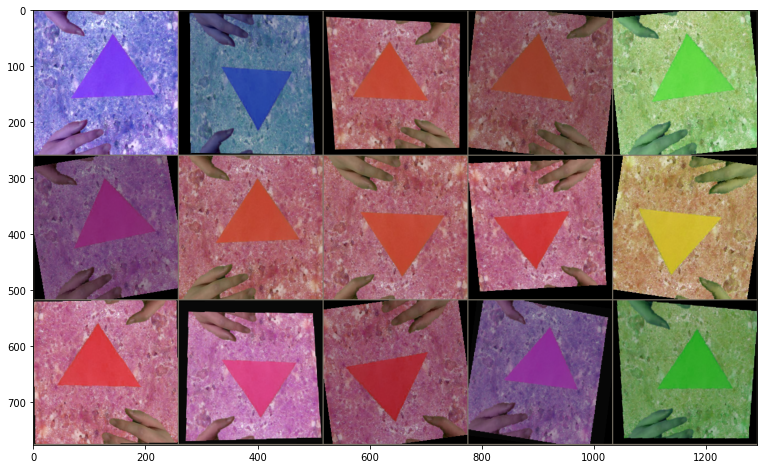

In [ ]:
## visualize data aug effect
im = plt.imread("data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1000.jpg")
print(im.shape, im.max(), im.min())
plt.imshow(im)
plt.show()

# row = 3
# col = 5
# plt.figure(figsize=(20,12))
# for i in range(row):
#   for j in range(1,col+1):
#     plt.subplot(row,col,i*col+j)
#     imshow(train_tansform(im))
# plt.show()

## use make_grid
n = 15
n_col = 5
img_list = []
for _ in range(n):
  img_list.append(train_tansform(im))
img_grid = torchvision.utils.make_grid(img_list, nrow=n_col)
n_row = (n-1) // 5 
plt.figure(figsize=(4*n_col, 4*n_row))
imshow(img_grid)

## Build baseline model

In [ ]:
# model = mobilenet_v3_small(weights=MobileNet_V3_Small_Weights.DEFAULT)
# model
# MobileNet_V3_Small_Weights.IMAGENET1K_V1._value_.transforms()

In [ ]:
class ResNetClassifier(nn.Module):
    def __init__(self, output_dim, which_resnet="resnet34"):
        super(ResNetClassifier, self).__init__()
        if which_resnet == "resnet34":
            self.model = resnet34(weights=ResNet34_Weights.DEFAULT)
        elif which_resnet == "resnet18":
            self.model = resnet18(weights=ResNet18_Weights.DEFAULT)
        elif which_resnet == "mobilenet_v3_small":
            self.model = mobilenet_v3_small(weights=MobileNet_V3_Small_Weights.DEFAULT)
        else:
            raise NotImplementedError()

        if "resnet" in which_resnet:
            self.model.fc = nn.Linear(self.model.fc.in_features, output_dim)
        elif "mobilenet" in which_resnet:
            self.model.classifier[3] = nn.Linear(self.model.classifier[3].in_features, output_dim)

    def forward(self, img):    
        return self.model(img)

## Define trainer & Train

In [ ]:
class Trainer:
    def __init__(self, model, train_dataset, val_dataset, test_dataset, opts):
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        print("on device:", self.device)
        self.model = model.float().to(self.device)

        self.epoch = opts["epoch"]
        self.optimizer = torch.optim.Adam(self.model.parameters(), \
                                        opts['lr'] if opts['lr'] else 1e-3)
        self.criterion = nn.CrossEntropyLoss()
        # self.criterion = nn.CrossEntropyLoss(ignore_index=0)
        self.train_loader = torch.utils.data.DataLoader(dataset=train_dataset, shuffle=True,
                            batch_size=opts['batch_size'], num_workers=opts["num_workers"],
                            pin_memory=True, drop_last=True)
        self.val_loader = torch.utils.data.DataLoader(dataset=val_dataset, shuffle=False,
                            batch_size=opts['batch_size'], num_workers=opts["num_workers"],
                            pin_memory=True, drop_last=True)
        self.test_loader = torch.utils.data.DataLoader(dataset=test_dataset, shuffle=False,
                            batch_size=opts['batch_size'], num_workers=opts["num_workers"],
                            pin_memory=True, drop_last=False)
        # self.val_freq = opts["val_freq"]
        self.opts = opts
  
    def train(self, save_dir="checkpoints/"+time.strftime("%y-%m-%d_%H-%M-%S"),
              model_output_name="model", 
              save_best=True, best_model_output_name="best_model"):
        self.model.train()
        self.tr_loss_list = []
        self.tr_acc_list = []
        self.val_loss_list = []
        self.val_acc_list = []
        best_val_acc = 0 

        # save config and hyper-parameter
        os.makedirs(save_dir, exist_ok=True)
        print("checkpoint_dir:", save_dir)
        self.save_dir = save_dir
        dump_yaml(self.opts, os.path.join(save_dir, "config.yaml"))

        progress_bar = trange(1, self.epoch+1)
        toc = time.time()
        for epoch in progress_bar:
            loss_list = []
            acc_list = []
            # train
            for i, (imgs, labels) in enumerate(self.train_loader):
                imgs = imgs.to(self.device, non_blocking=True)
                labels = labels.to(self.device, non_blocking=True)
                pred = self.model(imgs)
                loss = self.criterion(pred, labels)
                acc = (pred.argmax(dim=-1) == labels).float().mean()

                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
                loss_list.append(loss.item())
                acc_list.append(acc.item())
                tic = time.time()
                if i % 5 == 0:
                    print("epoch:",epoch, "batch:",i, "time used:%.2f"%(tic-toc), 
                        "loss:%.3f"%(loss.item()), "acc:%.3f"%(acc.item()))
            self.tr_loss_list.append(np.mean(loss_list))
            self.tr_acc_list.append(np.mean(acc_list))

            # validation
            # if i % self.val_freq == 0:
            val_loss, val_acc = self.validate(epoch=epoch)
            self.val_loss_list.append(val_loss)
            self.val_acc_list.append(val_acc)
            if save_best and val_acc > best_val_acc:
                best_val_acc = val_acc
                save_path = os.path.join(save_dir,best_model_output_name \
                                        + "_{:.3f}_epoch{}".format(val_acc, epoch))
                torch.save(self.model,  save_path)
                print("NEW BEST", "acc:", val_acc, "at", save_path)
            self.model.train()
      
            progress_bar.set_postfix({"tr_loss":self.tr_loss_list[-1], "tr_acc":self.tr_acc_list[-1],
                                      "val_loss":self.val_loss_list[-1], "val_acc":self.val_acc_list[-1],})
        save_path = os.path.join(save_dir, model_output_name)
        print("Training finished, save to ", save_path)
        torch.save(self.model, save_path)
        np.savez(os.path.join(save_dir, "loss_acc_data"),
            tr_loss_list=self.tr_loss_list, 
            tr_acc_list=self.tr_acc_list, 
            val_loss_list=self.val_loss_list, 
            val_acc_list=self.val_acc_list)

        return self.tr_loss_list, self.tr_acc_list, self.val_loss_list, self.val_acc_list
  
    def validate(self, epoch=0, n_class=None):
        """
        n_class: record the accuracy for n class
        """ 
        print("Validating")

        # record the accuracy for each class
        if n_class:
            class_acc = [[] for _ in range(n_class)]

        self.model.eval()
        val_loss = []
        val_acc = []
        with torch.no_grad():
            for i, (imgs, labels) in enumerate(self.val_loader):
                imgs = imgs.to(self.device, non_blocking=True)
                labels = labels.to(self.device, non_blocking=True)
                pred = self.model(imgs)
                loss = self.criterion(pred, labels)
                pred_label = pred.argmax(dim=-1)
                acc = (pred_label == labels).float().mean()
                val_loss.append(loss.item())
                val_acc.append(acc.item())

                if n_class: 
                    labels = labels.detach().cpu().numpy()
                    pred_label = pred_label.detach().cpu().numpy()
                    for cls in range(n_class):
                        mask = labels == cls
                        if np.sum(mask) == 0:
                            continue
                        class_acc[cls].append( (pred_label[mask] == labels[mask]).mean() )
        val_loss = np.mean(val_loss)
        val_acc = np.mean(val_acc)
        print("--Epoch:", epoch, "val_loss:", val_loss, "val_acc:", val_acc)
        if n_class:
            class_acc = [np.mean(acc_list) for acc_list in class_acc]
            print("class ave acc:")
            print(dict(zip(range(n_class), class_acc)))
        return val_loss, val_acc

    def test(self, model_path=None, n_class=None):
        """
        n_class: calculate separate accuracy for each class
        """
        print("Testing")
        # record the accuracy for each class
        if n_class:
            class_acc = [[] for _ in range(n_class)]
        # restore the model
        if model_path is not None:
            self.model = torch.load(model_path, map_location=self.device)
        self.model.eval().float() 
        test_loss = []
        test_acc = []
        with torch.no_grad():
            for i, (imgs, labels) in enumerate(self.test_loader):
                imgs = imgs.to(self.device, non_blocking=True)
                labels = labels.to(self.device, non_blocking=True)
                pred = self.model(imgs)
                loss = self.criterion(pred, labels)
                pred_label = pred.argmax(dim=-1)
                acc = (pred_label == labels).float().mean()
                test_loss.append(loss.item())
                test_acc.append(acc.item())

                if n_class:
                    labels = labels.detach().cpu().numpy()
                    pred_label = pred_label.detach().cpu().numpy()
                    for cls in range(n_class):
                        mask = labels == cls
                        if np.sum(mask) == 0:
                            continue
                        class_acc[cls].append( (pred_label[mask] == labels[mask]).mean() )
        test_loss = np.mean(test_loss)
        test_acc = np.mean(test_acc)
        print("test_loss", test_loss, "test_acc", test_acc)
        if n_class:
            class_acc = [np.mean(acc_list).round(2) for acc_list in class_acc]
            print("class ave acc:", np.mean(class_acc))
            print(dict(zip(range(n_class), class_acc)))
            return test_acc, class_acc
        return test_acc



In [ ]:
opts = {
    ## model choice
    "model_name": "resnet18",
    # "data_split": "data_split_v2.npz",
    # "data_split": "data_split_OSMOv1.npz",
    "data_split": "data/data_split_both_syn_2vid_v1.npz",

    ## hyper-param"
    "epoch": 10,
    # "lr": 2e-5,
    "lr": 1e-6,
    "batch_size": 128,
    # "num_workers":12,
    "num_workers":4,

    ## debug info control
    # "val_freq":50, # in terms of epoch

    ## parameters for origami model
    "N_LABEL": 11
}

## build load dataset split and test data
train_paths, train_labels, val_paths, val_labels, test_paths, test_labels = \
    load_data_path_from_split_file(opts["data_split"])
# # separate test data
# test_video_folders = [
#     "data/3_iPad_anno_homog",
#     # "data/3_phone_pruned_anno"
# ]
# test_paths, test_labels = load_test_data_from_folders(test_video_folders)

train_dataset = oriDataset(train_paths, train_labels)
val_dataset = oriDataset(val_paths, val_labels, eval=True)
test_dataset = oriDataset(test_paths, test_labels, eval=True)
print("train_dataset:", len(train_dataset), 
      "val_dataset:", len(val_dataset),
      "test_dataset:", len(test_dataset))

## build model
model = ResNetClassifier(N_LABEL, which_resnet=opts["model_name"])

## build trainer
trainer = Trainer(model,train_dataset=train_dataset, 
                  val_dataset=val_dataset, test_dataset=test_dataset, opts=opts)

train_dataset: 7193 val_dataset: 892 test_dataset: 891
on device: cuda:0


tensor(5)


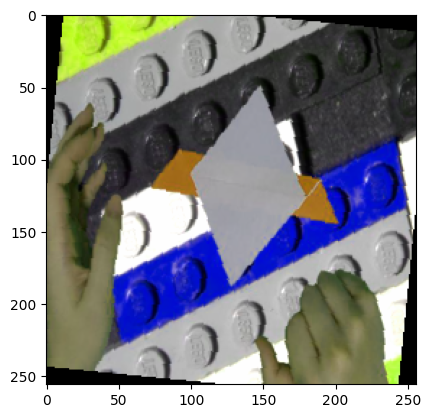

In [ ]:
# check the dataloader
img, label = next(iter(trainer.train_loader))
print(label[0])
imshow(img[0])

In [ ]:
# folder_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone"

checkpoint_dir = "checkpoints/"+ trainer.opts["model_name"]+ "_" + \
    trainer.opts["data_split"].split(".")[0].split("split_")[-1] + "_" +\
    time.strftime("%m-%d_%H-%M")

In [ ]:
tr_loss_list, tr_acc_list, val_loss_list, val_acc_list = \
    trainer.train(save_dir=checkpoint_dir)

checkpoint_dir: checkpoints/resnet18_both_syn_2vid_v1_05-14_02-30


  0%|          | 0/10 [00:00<?, ?it/s]

epoch: 1 batch: 0 time used:16.50 loss:2.578 acc:0.109
epoch: 1 batch: 5 time used:31.02 loss:2.605 acc:0.055
epoch: 1 batch: 10 time used:44.88 loss:2.611 acc:0.102
epoch: 1 batch: 15 time used:61.68 loss:2.568 acc:0.102
epoch: 1 batch: 20 time used:84.73 loss:2.614 acc:0.094
epoch: 1 batch: 25 time used:98.98 loss:2.590 acc:0.109
epoch: 1 batch: 30 time used:112.98 loss:2.548 acc:0.133
epoch: 1 batch: 35 time used:127.58 loss:2.570 acc:0.070
epoch: 1 batch: 40 time used:152.79 loss:2.652 acc:0.039
epoch: 1 batch: 45 time used:167.61 loss:2.562 acc:0.117
epoch: 1 batch: 50 time used:181.62 loss:2.568 acc:0.117
epoch: 1 batch: 55 time used:193.46 loss:2.629 acc:0.078
Validating
--Epoch: 1 val_loss: 2.5694106022516885 val_acc: 0.10416666666666667
NEW BEST acc: 0.10416666666666667 at checkpoints/resnet18_both_syn_2vid_v1_05-14_02-30/best_model_0.104_epoch1
epoch: 2 batch: 0 time used:221.77 loss:2.616 acc:0.094
epoch: 2 batch: 5 time used:237.53 loss:2.646 acc:0.070
epoch: 2 batch: 10 ti

In [ ]:
!pwd
glob.glob("data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/188*")

/content/drive/MyDrive/Colab Notebooks/CMU/Capstone


['data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1888.jpg',
 'data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1885.jpg',
 'data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1884.jpg',
 'data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1886.jpg',
 'data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1887.jpg',
 'data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1883.jpg',
 'data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1882.jpg',
 'data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1880.jpg',
 'data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1889.jpg',
 'data/synthetic_dataset/22_0_ipad_homog_226_c1l3r180/1881.jpg']

## Evaluate model

In [ ]:
def plot_loss_acc(train_loss=None, val_loss=None,
                  train_acc=None, val_acc=None,
                  trainer=None, loss_dict_name=None, #"loss_dict.pickle"
                  figsize=(8,7), save_dir=None): 
    """
    Plot loss & acc curve to check convergence and overfitting

    notes:
    1. plot loss/acc curve for train&val if given
    2. Either trainer or the loss_dict_name should be given (not imp yet)
    3. Save to save_dir if loss_dict_name is not None
    """
    assert trainer is not None or loss_dict_name is not None
    if trainer is not None:
        train_loss = getattr(trainer, "tr_loss_list", None)
        train_acc = getattr(trainer, "tr_acc_list", None)
        val_loss = getattr(trainer, "val_loss_list", None)
        val_acc = getattr(trainer, "val_acc_list", None)
    if loss_dict_name:
        loss_dict = np.load(loss_dict_name)
        train_loss = loss_dict["tr_loss_list"]
        train_acc = loss_dict["tr_acc_list"]
        val_loss = loss_dict["val_loss_list"]
        val_acc = loss_dict["val_acc_list"]

    # plot loss
    if train_loss is not None:
        epoch = range(1, len(train_loss)+1)
        fig, ax = plt.subplots(1,1, figsize=figsize)
        ax.plot(epoch, train_loss, marker=".", label="train_loss")

        if val_loss is not None:
            print(f"best val loss {min(val_loss)}")
            ax.plot(epoch, val_loss, marker="o", label="val_loss")
            ax.legend()

        # ax.set_title("Training loss curve")
        ax.set_xlabel("epoch")
        ax.set_ylabel("loss")
        # ax[0].set_ylim(0,5)
        #     ax[0].set_yscale('log')
        if save_dir: 
            plt.savefig(os.path.join(save_dir,"train_loss_curve"), dpi=200)
        plt.show()
    
    # plot acc
    if train_acc is not None:
        epoch = range(1, len(train_acc)+1)
        fig, ax = plt.subplots(1,1, figsize=figsize)
        ax.plot(epoch, train_acc, marker=".", label="train_acc")

        if val_acc is not None:
            print(f"best val acc {max(val_acc)}")
            ax.plot(epoch, val_acc, marker="o", label="val_acc")
            ax.legend()
        # ax.set_title("Training acc curve")
        ax.set_xlabel("epoch")
        ax.set_ylabel("acc")
        if save_dir: 
            plt.savefig(os.path.join(save_dir,"train_acc_curve"), dpi=200)
        plt.show()

def test_new_image(paths, labels, trainer=None, model_path=None, 
                   n_per_row=4, figsize=(15,10), save_dir=None):
    """
    Test model in either trainer or model path on images from paths
    """
    assert trainer is not None or model_path is not None
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    if trainer:
        model = trainer.model
        device = trainer.device
    if model_path:
        model = torch.load(model_path, map_location=device)
  
    model.eval().float()
    correct = 0
    img_list = []
    title_list = []
    with torch.no_grad():
        for i, (path, label) in enumerate(zip(paths, labels)):
            img = np.array(Image.open(path))
            img = test_transform(img)
            img_list.append(img)
            imgs = img.unsqueeze(0)
            imgs = imgs.to(device)

            pred = model(imgs).detach().cpu().numpy()
            pred_label = pred.argmax(axis=-1)[0]
            if pred_label == label:
                correct += 1
            title_list.append(f"gt: {label}, pred: {pred_label}")
      
  # visualize
    plot_tensor_image_grid(img_list, n_per_row, title_list, figsize=figsize)
    if save_dir: 
        plt.suptitle(f"test_new_image_{round(correct/len(labels), 4)}")
        plt.savefig(os.path.join(save_dir,"test_new_image"), dpi=200)
    plt.show()
    print("Test accuracy on new data:", correct/len(labels))

def get_testset_success_failure_grid(
    test_dataset, trainer=None, model_path=None, 
    n_sample_per_cls=2, n_failure_case=5, n_cls=N_LABEL):
    """
    visualize success and failure case on test dataset.

    note:
    1. either trainer or model path is needed
    """
    ## load model
    assert trainer is not None or model_path is not None
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    if trainer:
        model = trainer.model
        device = trainer.device
    elif model_path:
        model = torch.load(model_path, map_location=device)
    model.eval().float()
    test_loader = torch.utils.data.DataLoader(dataset=test_dataset, shuffle=True,
                                              batch_size=4, num_workers=4,
                                              pin_memory=True, drop_last=False)

    # run through test data and save samples
    correct_count = 0
    success_dict = {cls:[] for cls in range(n_cls)}
    failure_samples = [] # [gt_label, pred_label, image]
    with torch.no_grad():
        for i, (imgs, labels) in enumerate(test_loader):
            _imgs = imgs.to(device, non_blocking=True)
            labels = labels.detach().cpu().numpy()
            pred = model(_imgs)
            pred = pred.detach().cpu().numpy()
            pred_label = pred.argmax(axis=-1)

            for j, (gt_label, pd_label) in enumerate(zip(labels,pred_label)):
                if gt_label == pd_label: # add to success_dict
                    if len(success_dict[gt_label]) == n_sample_per_cls:
                        continue
                    success_dict[gt_label].append( imgs[j] )
                else: # add to failure_samples
                    if len(failure_samples) >= n_failure_case:
                        continue
                    failure_samples.append( (gt_label, pd_label, imgs[j]) )
                
                if correct_count == n_sample_per_cls * n_cls and \
                    len(failure_samples) == n_failure_case:
                        break

    # plot success image grid
    title_list, img_list = [],[]
    for label, cls_image_list in success_dict.items():
        for cls_image in cls_image_list:
            title_list.append(f"label: {label}")
            img_list.append(cls_image)
    print("success samples",len(img_list))
    success_img_list = img_list
    success_title_list = title_list

    # plot failure image grid
    title_list, img_list = [],[]
    print("failure_samples:", len(failure_samples), "out of", len(test_dataset))
    for gt_label, pred_label, image in failure_samples:
        title_list.append(f"gt: {gt_label}, pred: {pred_label}")
        img_list.append(image)
    failure_img_list = img_list
    failure_title_list = title_list
    return success_img_list, success_title_list, failure_img_list, failure_title_list
  

def get_test_confusion_mat(
    test_dataset, trainer=None, model_path=None, 
    n_cls=N_LABEL):
    """
    visualize success and failure case on test dataset.

    note:
    1. either trainer or model path is needed
    """
    ## load model
    assert trainer is not None or model_path is not None
    if trainer:
        model = trainer.model
        device = trainer.device
    elif model_path:
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        model = torch.load(model_path, map_location=device)
    model.eval().float()
    test_loader = torch.utils.data.DataLoader(dataset=test_dataset, shuffle=True,
                                              batch_size=4, num_workers=4,
                                              pin_memory=True, drop_last=False)

    # run through test data and save samples
    confusion_mat = np.zeros((n_cls,n_cls), dtype=int)
    with torch.no_grad():
        for i, (imgs, labels) in enumerate(test_loader):
            _imgs = imgs.to(device, non_blocking=True)
            labels = labels.detach().cpu().numpy()
            pred = model(_imgs)
            pred = pred.detach().cpu().numpy()
            pred_label = pred.argmax(axis=-1)

            for j, (gt_label, pd_label) in enumerate(zip(labels,pred_label)):
                confusion_mat[gt_label, pd_label] += 1
    return confusion_mat


### resnet18_OSMOv1

In [ ]:
# checkpoint_dir = "checkpoints/resnet18_OSMOv1_03-17_12-29"
checkpoint_dir = "checkpoints/resnet18_OSMOv1_03-17_19-43"
model_path = checkpoint_dir+"/model"

best val loss 0.014034961217216082


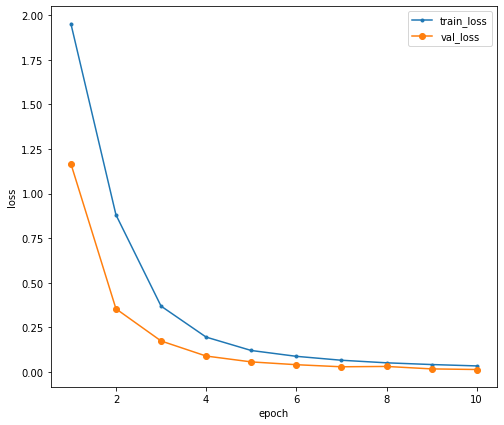

best val acc 0.9977678571428571


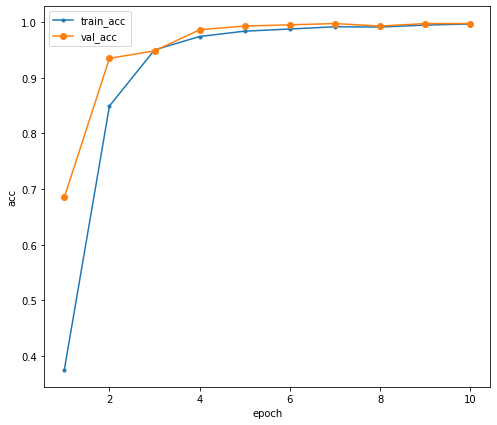

Testing
test_loss 0.015664867707528174 test_acc 0.998046875
class ave acc:
{0: 0.975609756097561, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0, 5: 1.0, 6: 1.0, 7: 1.0, 8: 1.0, 9: 1.0, 10: 1.0}


In [ ]:
## plot curve
plot_loss_acc(trainer=None, save_dir=checkpoint_dir,
              loss_dict_name=checkpoint_dir+"/loss_acc_data.npz")
# plot_loss_acc(trainer=trainer, save_dir=checkpoint_dir)

## test acc
trainer.test(model_path=model_path, n_class=N_LABEL )
# trainer.test(n_class=N_LABEL)

In [ ]:
## separate test data
trainer.test(model_path=model_path, n_class=N_LABEL )


Testing
test_loss 1.8845538695653279 test_acc 0.41510416691501933
class ave acc:
{0: 1.0, 1: 0.4666666666666667, 2: 0.4326923076923077, 3: 0.6666666666666666, 4: 0.3920454545454546, 5: 0.3, 6: 1.0, 7: 0.26666666666666666, 8: 0.3705357142857143, 9: 0.0, 10: 0.1}


success samples 22
failure_samples: 1 out of 451


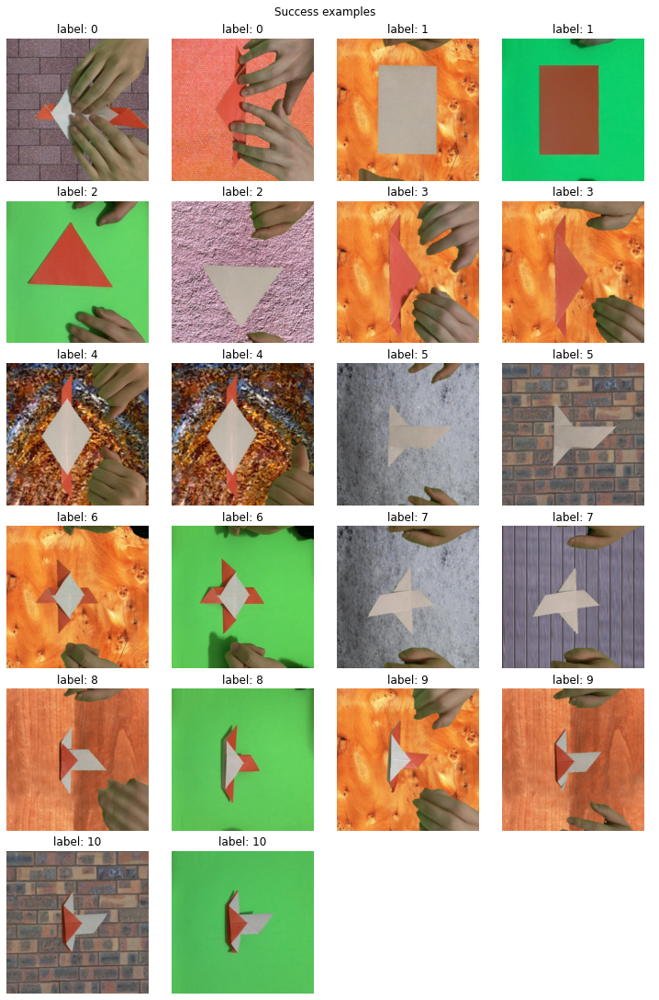

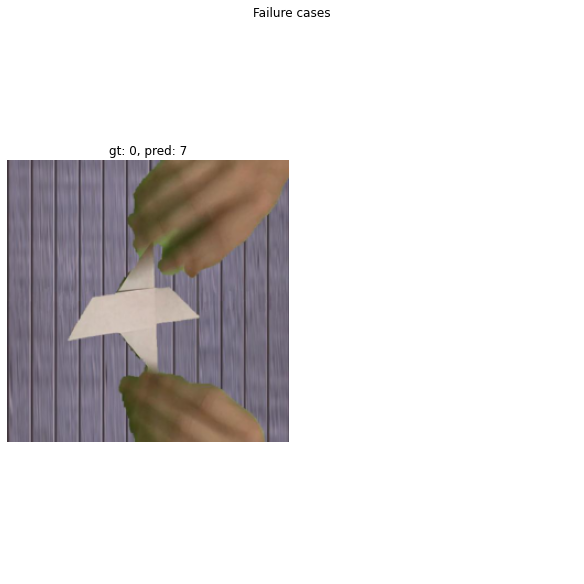

In [ ]:
# visuaalize good and bad samples
n_sample_per_cls = 2
n_failure_case = 1000
success_n_per_row=4
failure_n_per_row=2

success_img_list, success_title_list, failure_img_list, failure_title_list = \
    get_testset_success_failure_grid(
      test_dataset, trainer=None, model_path=model_path, 
      n_sample_per_cls=n_sample_per_cls, n_failure_case=n_failure_case, 
      n_cls=N_LABEL)
# success_img_list, success_title_list, failure_img_list, failure_title_list = \
#     get_testset_success_failure_grid(
#       test_dataset, trainer=trainer, model_path=None, 
#       n_sample_per_cls=n_sample_per_cls, n_failure_case=n_failure_case, 
#       n_cls=N_LABEL)

plot_tensor_image_grid(success_img_list, success_n_per_row, success_title_list, figsize=(10,15))
plt.suptitle("Success examples")
plt.savefig(os.path.join(checkpoint_dir, "Success_examples"), dpi=200)
plt.show()
plot_tensor_image_grid(failure_img_list, failure_n_per_row, failure_title_list, figsize=(8,8))
plt.suptitle("Failure cases")
plt.savefig(os.path.join(checkpoint_dir, "Failure_examples"), dpi=200)
plt.show()

### resnet18_datav2

In [ ]:
checkpoint_dir = "checkpoints/resnet18_v2_03-16_11-50"
model_path = checkpoint_dir+"/model"

best val loss 0.0805540985117356


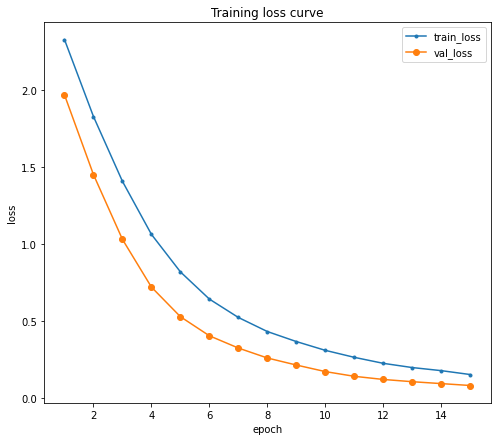

best val acc 0.9921875


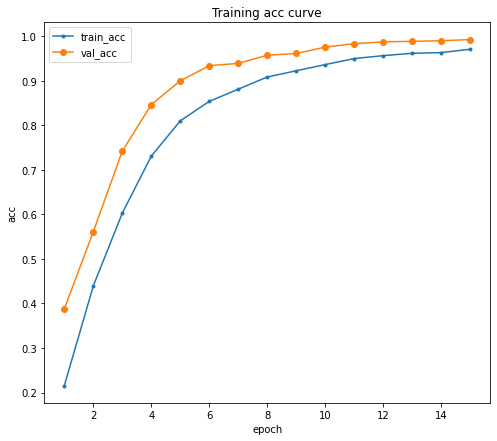

In [ ]:
## plot curve
# plot_loss_acc(trainer=trainer, save_dir=checkpoint_dir)

# plot_loss_acc(trainer=None, save_dir=checkpoint_dir,
#               loss_dict_name=checkpoint_dir+"/loss_acc_data.npz") # no loss data yet

In [ ]:
# test acc
# trainer.test(model_path="/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/model", 
#              n_class=len(np.unique(labels)) )
# trainer.test(n_class=N_LABEL)

## test acc
trainer.test(model_path=model_path, n_class=N_LABEL )
# trainer.test(n_class=N_LABEL)

Testing


/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


test_loss 0.10905023903719016 test_acc 0.9784226204667773
class ave acc:
{0: 0.953125, 1: 1.0, 2: 1.0, 3: 0.96875, 4: 0.984375, 5: 1.0, 6: 1.0, 7: 1.0, 8: 0.9921875, 9: 0.9427083333333333, 10: 0.9270833333333333}


In [ ]:
test_acc, class_acc = trainer.test(model_path=model_path, n_class=trainer.opts["N_LABEL"] )

Testing
test_loss 0.8808100670576096 test_acc 0.6791666646798452
class ave acc: 0.6754545454545455
{0: 0.77, 1: 0.47, 2: 1.0, 3: 1.0, 4: 0.68, 5: 0.7, 6: 1.0, 7: 0.7, 8: 0.43, 9: 0.03, 10: 0.65}


In [ ]:
cls_acc_dict = {0: 0.83, 1: 0.64, 2: 1.0, 3: 0.94, 4: 0.67, 5: 0.82, 6: 1.0, 7: 0.85, 8: 0.3, 9: 0.02, 10: 0.79}
formatted_vals = ""
for i in range(11):
    formatted_vals += f"{cls_acc_dict[i]:_^8.2}|"
formatted_vals

'__0.83__|__0.64__|__1.0___|__0.94__|__0.67__|__0.82__|__1.0___|__0.85__|__0.3___|__0.02__|__0.79__|'

success samples 22
failure_samples: 5 out of 880


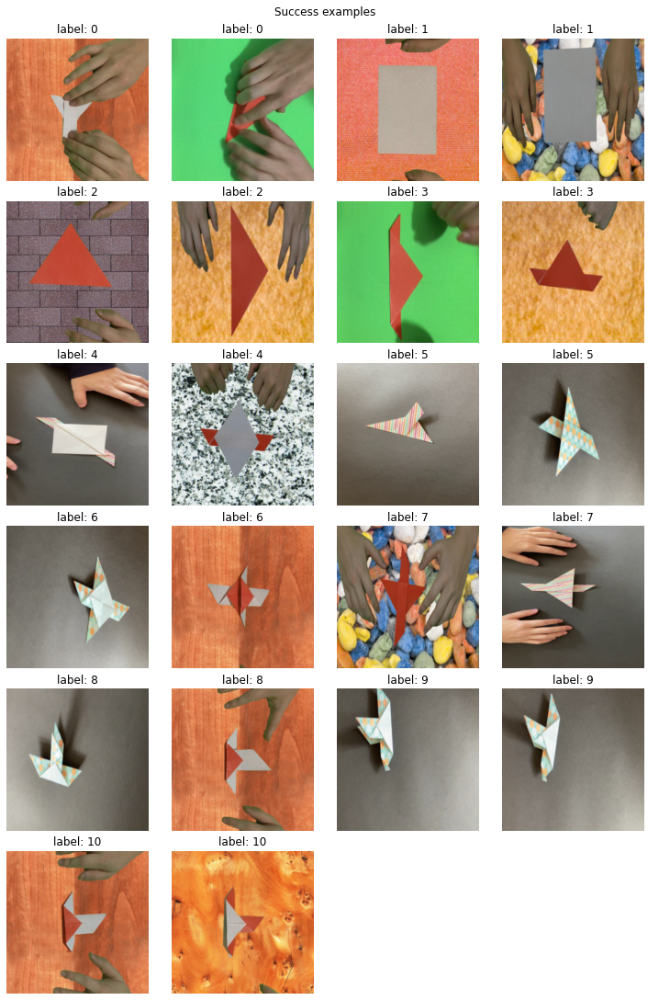

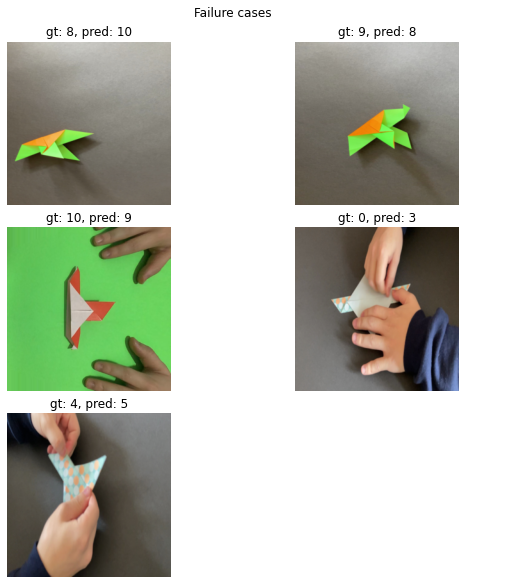

In [ ]:
# visualize good and bad samples
n_sample_per_cls = 2
n_failure_case = 5
success_n_per_row=4
failure_n_per_row=2

# model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/best_model"
# success_img_list, success_title_list, failure_img_list, failure_title_list = \
#     get_testset_success_failure_grid(
#       test_dataset, trainer=None, model_path=model_path, 
#       n_sample_per_cls=n_sample_per_cls, n_failure_case=n_failure_case, 
#       n_cls=N_LABEL)
success_img_list, success_title_list, failure_img_list, failure_title_list = \
    get_testset_success_failure_grid(
      test_dataset, trainer=trainer, model_path=None, 
      n_sample_per_cls=n_sample_per_cls, n_failure_case=n_failure_case, 
      n_cls=N_LABEL)

plot_tensor_image_grid(success_img_list, success_n_per_row, success_title_list, figsize=(10,15))
plt.suptitle("Success examples")
plt.savefig(os.path.join(checkpoint_dir, "Success_examples"), dpi=200)
plt.show()
plot_tensor_image_grid(failure_img_list, failure_n_per_row, failure_title_list, figsize=(8,8))
plt.suptitle("Failure cases")
plt.savefig(os.path.join(checkpoint_dir, "Failure_examples"), dpi=200)
plt.show()

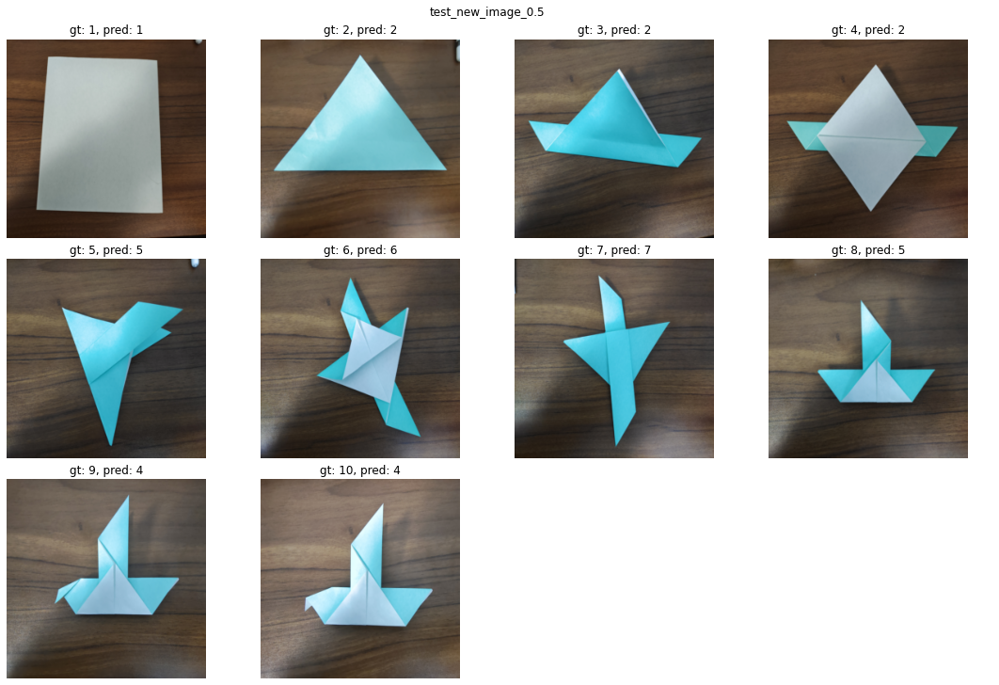

Test accuracy on new data: 0.5


In [ ]:
## test on new image
paths = [f"data/new_test/{i}.jpg" for i in range(1,11)]
labels = list(range(1,11))
figsize=(15,10)

# model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/best_model"
# model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/23-02-16_09-23-52/best_model_0.995_epoch3"
# test_new_image(paths, labels, trainer=None, model_path=model_path, 
#               n_per_row=4, figsize=figsize)

test_new_image(paths, labels, trainer=trainer, model_path=None, 
              n_per_row=4, figsize=figsize, save_dir=checkpoint_dir)

In [ ]:
sorted(glob.glob("./data/resized_train_data/22_0_ipad_homog_bg2wood_pre/*.jpg"), 
       key=lambda path: int(os.path.splitext(os.path.basename(path))[0]) )

['./data/resized_train_data/22_0_ipad_homog_bg2wood_pre/374.jpg',
 './data/resized_train_data/22_0_ipad_homog_bg2wood_pre/442.jpg',
 './data/resized_train_data/22_0_ipad_homog_bg2wood_pre/982.jpg',
 './data/resized_train_data/22_0_ipad_homog_bg2wood_pre/1401.jpg',
 './data/resized_train_data/22_0_ipad_homog_bg2wood_pre/1688.jpg',
 './data/resized_train_data/22_0_ipad_homog_bg2wood_pre/2158.jpg',
 './data/resized_train_data/22_0_ipad_homog_bg2wood_pre/2588.jpg',
 './data/resized_train_data/22_0_ipad_homog_bg2wood_pre/2693.jpg',
 './data/resized_train_data/22_0_ipad_homog_bg2wood_pre/2893.jpg',
 './data/resized_train_data/22_0_ipad_homog_bg2wood_pre/3043.jpg',
 './data/resized_train_data/22_0_ipad_homog_bg2wood_pre/3233.jpg']

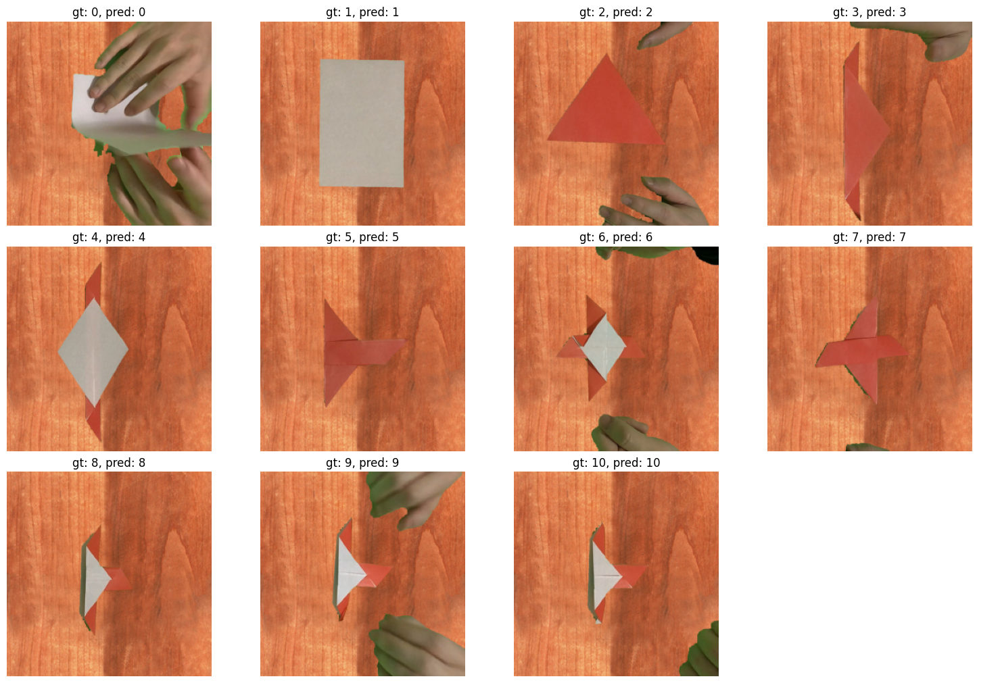

Test accuracy on new data: 1.0


In [ ]:
## test on new image
paths = sorted(glob.glob("./data/resized_train_data/22_0_ipad_homog_bg2wood_pre/*.jpg"), 
               key=lambda path: int(os.path.splitext(os.path.basename(path))[0]) )
labels = list(range(0,11))
figsize=(15,10)

# model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/best_model"
# model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/23-02-16_09-23-52/best_model_0.995_epoch3"
# test_new_image(paths, labels, trainer=None, model_path=model_path, 
#               n_per_row=4, figsize=figsize)

test_new_image(paths, labels, trainer=trainer, model_path=None, 
              n_per_row=4, figsize=figsize, save_dir=None) #

In [ ]:
confusion_mat = get_test_confusion_mat(
    test_dataset, trainer=None, model_path=model_path, n_cls=N_LABEL)

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


<Axes: >

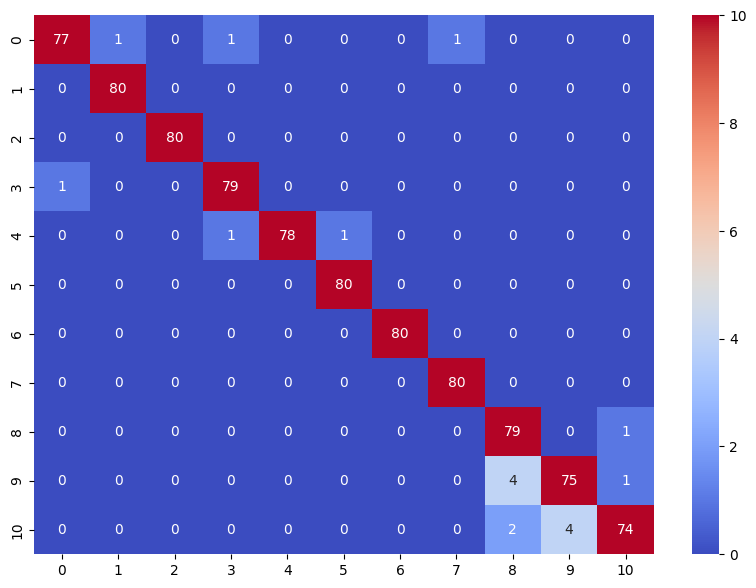

In [ ]:
df_confusion = pd.DataFrame(confusion_mat, index = range(N_LABEL), columns = range(N_LABEL))
plt.figure(figsize = (10,7))
sns.heatmap(df_confusion, annot=True, cmap="coolwarm", vmax=10)

In [ ]:
confusion_mat

array([[77,  1,  0,  1,  0,  0,  0,  1,  0,  0,  0],
       [ 0, 80,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0, 80,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 1,  0,  0, 79,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  1, 78,  1,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0, 80,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0, 80,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 80,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 79,  0,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  4, 75,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  2,  4, 74]])

### mobilenet3

In [ ]:
checkpoint_dir = "checkpoints/mobilenet3_03-16_08-35"

best val loss 0.0451177137112245


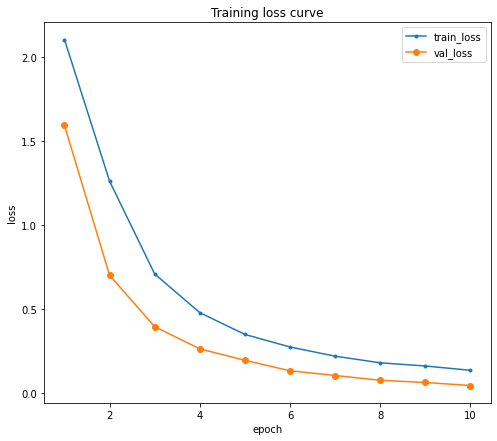

best val acc 0.99


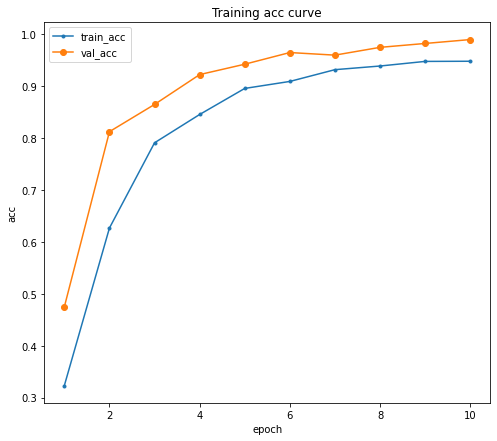

In [ ]:
plot_loss_acc(trainer=trainer, save_dir=checkpoint_dir)

In [ ]:
# test acc
# trainer.test(model_path="/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/model", 
#              n_class=len(np.unique(labels)) )
trainer.test(n_class=N_LABEL)

Testing


/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


test_loss 0.03534497743553052 test_acc 0.9951923076923077
class ave acc:
{0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0, 5: 1.0, 6: 1.0, 7: 1.0, 8: 1.0, 9: 0.9486607142857143, 10: 1.0}


/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


success samples 22
failure_samples: 2 out of 409


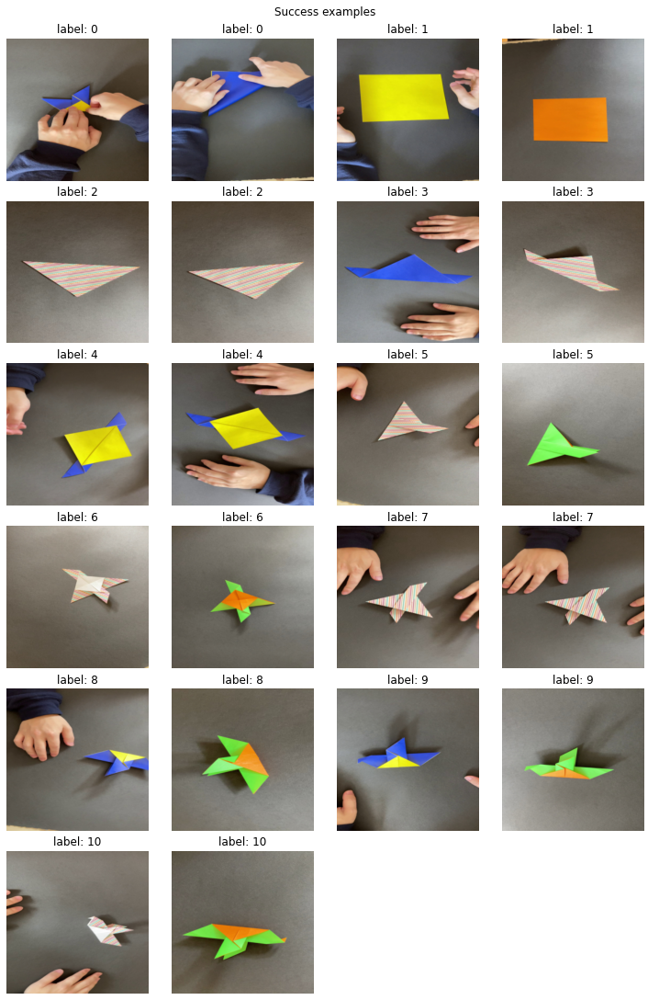

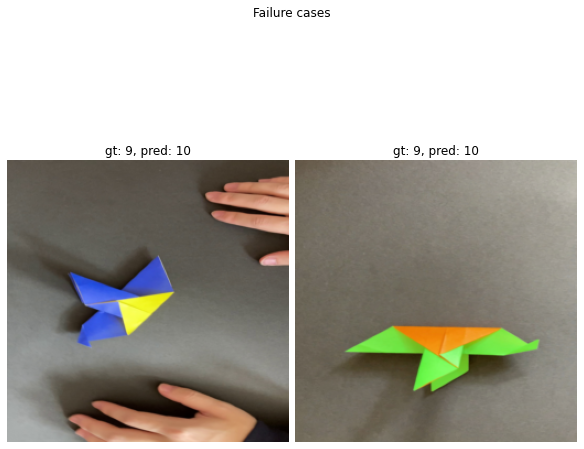

In [ ]:
# visuaalize good and bad samples
model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/best_model"
n_sample_per_cls = 2
n_failure_case = 5
success_n_per_row=4
failure_n_per_row=2

# success_img_list, success_title_list, failure_img_list, failure_title_list = \
#     get_testset_success_failure_grid(
#       test_dataset, trainer=None, model_path=model_path, 
#       n_sample_per_cls=n_sample_per_cls, n_failure_case=n_failure_case, 
#       n_cls=N_LABEL)
success_img_list, success_title_list, failure_img_list, failure_title_list = \
    get_testset_success_failure_grid(
      test_dataset, trainer=trainer, model_path=None, 
      n_sample_per_cls=n_sample_per_cls, n_failure_case=n_failure_case, 
      n_cls=N_LABEL)

plot_tensor_image_grid(success_img_list, success_n_per_row, success_title_list, figsize=(10,15))
plt.suptitle("Success examples")
plt.savefig(os.path.join(checkpoint_dir, "Success_examples"), dpi=200)
plt.show()
plot_tensor_image_grid(failure_img_list, failure_n_per_row, failure_title_list, figsize=(8,8))
plt.suptitle("Failure cases")
plt.savefig(os.path.join(checkpoint_dir, "Failure_examples"), dpi=200)
plt.show()

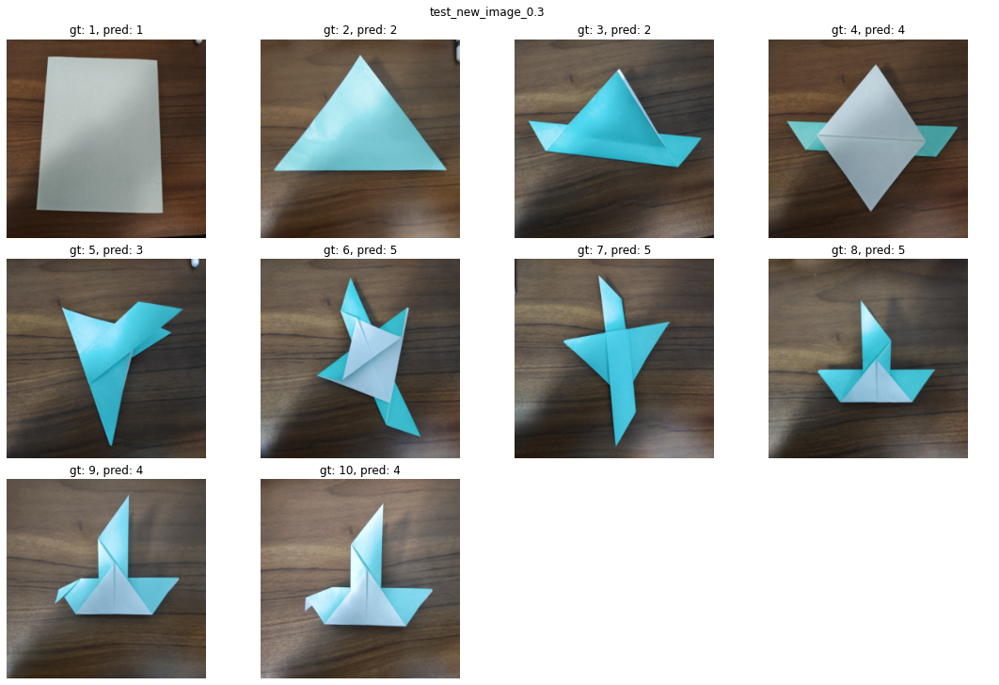

Test accuracy on new data: 0.3


In [ ]:
## test on new image
paths = [f"data/new_test/{i}.jpg" for i in range(1,11)]
labels = list(range(1,11))
figsize=(15,10)
# model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/best_model"
# model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/23-02-16_09-23-52/best_model_0.995_epoch3"

# test_new_image(paths, labels, trainer=None, model_path=model_path, 
#               n_per_row=4, figsize=figsize)
test_new_image(paths, labels, trainer=trainer, model_path=None, 
              n_per_row=4, figsize=figsize, save_dir=checkpoint_dir)

### resnet18

best val loss 0.022936417507007718


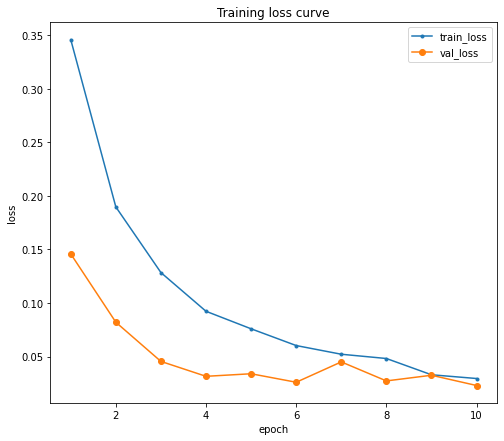

best val acc 0.995


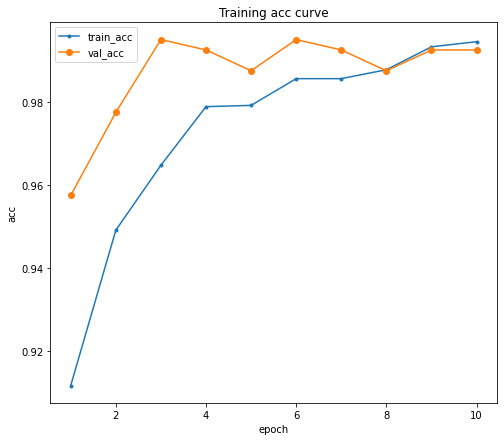

In [ ]:
plot_loss_acc(trainer=trainer)

In [ ]:
# test acc
# trainer.test(model_path="/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/model", 
#              n_class=len(np.unique(labels)) )
trainer.test(n_class=N_LABEL)

Testing


/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


test_loss 0.005486436989695693 test_acc 0.9975961538461539
class ave acc:
{0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0, 5: 0.984375, 6: 1.0, 7: 1.0, 8: 1.0, 9: 1.0, 10: 1.0}


In [ ]:
# visualize good and bad samples
model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/best_model"
n_sample_per_cls = 2
n_failure_case = 5
success_n_per_row=4
failure_n_per_row=2

# success_img_list, success_title_list, failure_img_list, failure_title_list = \
#     get_testset_success_failure_grid(
#       test_dataset, trainer=None, model_path=model_path, 
#       n_sample_per_cls=n_sample_per_cls, n_failure_case=n_failure_case, 
#       n_cls=N_LABEL)
success_img_list, success_title_list, failure_img_list, failure_title_list = \
    get_testset_success_failure_grid(
      test_dataset, trainer=trainer, model_path=None, 
      n_sample_per_cls=n_sample_per_cls, n_failure_case=n_failure_case, 
      n_cls=N_LABEL)

success samples 22
failure_samples: 1 409


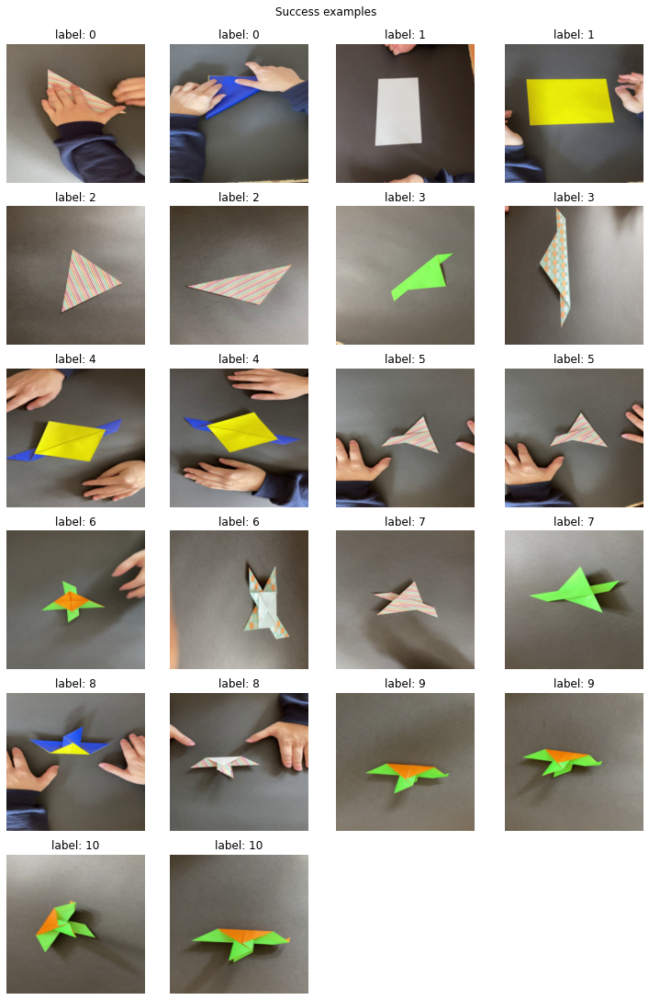

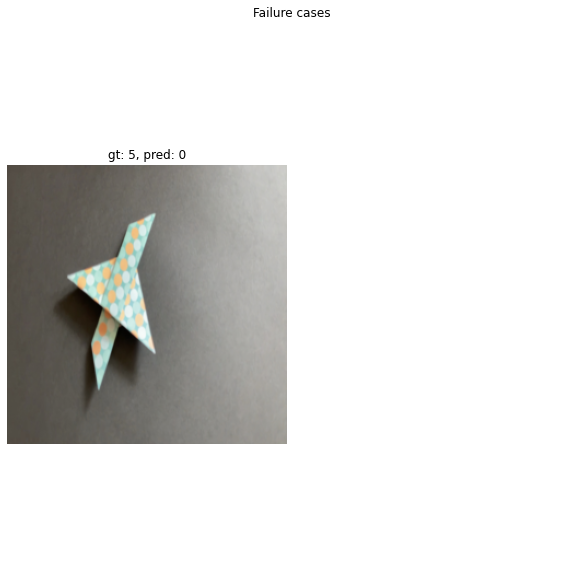

In [ ]:
plot_tensor_image_grid(success_img_list, success_n_per_row, success_title_list, figsize=(10,15))
plt.suptitle("Success examples")
plt.show()
plot_tensor_image_grid(failure_img_list, failure_n_per_row, failure_title_list, figsize=(8,8))
plt.suptitle("Failure cases")
plt.show()

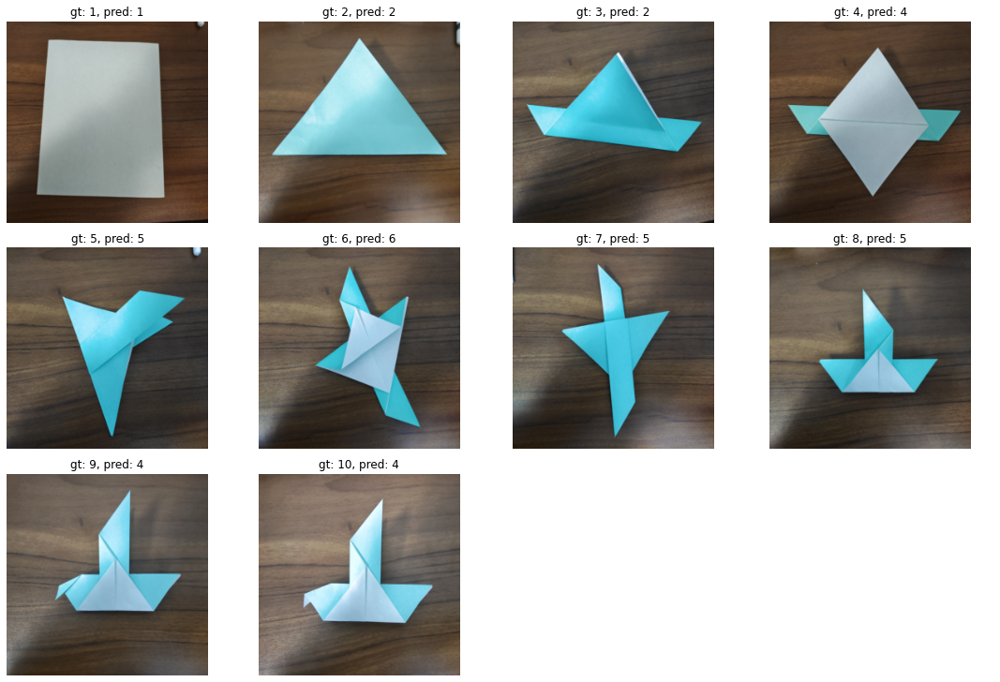

Test accuracy on new data: 0.5


In [ ]:
## test on new image
paths = [f"data/new_test/{i}.jpg" for i in range(1,11)]
labels = list(range(1,11))
# model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/best_model"
# model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/23-02-16_09-23-52/best_model_0.995_epoch3"
model_path = "/content/drive/MyDrive/Colab Notebooks/CMU/Capstone/checkpoints/23-02-16_09-23-52/model"
figsize=(15,10)

test_new_image(paths, labels, trainer=None, model_path=model_path, 
              n_per_row=4, figsize=figsize)
# test_new_image(paths, labels, trainer=trainer, model_path=None, 
#               n_per_row=4, figsize=figsize)